In [1]:
#Importing library
import geopandas as gpd
import matplotlib.pyplot as plt

/opt/conda/lib/python3.7/site-packages/geopandas/_compat.py:115: UserWarning: The Shapely GEOS version (3.9.1-CAPI-1.14.2) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  shapely_geos_version, geos_capi_version_string


In [2]:
#reading the data
full_data = gpd.read_file("../input/geospatial-learn-course-data/DEC_lands/DEC_lands/DEC_lands.shp")
data = full_data.loc[:, ["CLASS", "COUNTY", "geometry"]].copy()
data = data.dropna()
data.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 1219 entries, 0 to 2982
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   CLASS     1219 non-null   object  
 1   COUNTY    1219 non-null   object  
 2   geometry  1219 non-null   geometry
dtypes: geometry(1), object(2)
memory usage: 38.1+ KB


In [3]:
data.to_file("camping trip.geojson", driver="GeoJSON")

In [4]:
data['area'] = data.area
data['boundary'] = data.boundary
data['centroid'] = data.centroid
data.head()

,CLASS,COUNTY,geometry,area,boundary,centroid
0,WILD FOREST,DELAWARE,"POLYGON ((486093.245 4635308.586, 486787.235 4...",2.990365e+06,"LINESTRING (486093.245 4635308.586, 486787.235...",POINT (486894.051 4634392.063)
1,WILD FOREST,DELAWARE,"POLYGON ((491931.514 4637416.256, 491305.424 4...",1.143940e+06,"LINESTRING (491931.514 4637416.256, 491305.424...",POINT (491895.306 4638345.024)
2,WILD FOREST,DELAWARE,"POLYGON ((486000.287 4635834.453, 485007.550 4...",9.485476e+05,"LINESTRING (486000.287 4635834.453, 485007.550...",POINT (485865.722 4636330.332)
3,WILD FOREST,GREENE,"POLYGON ((541716.775 4675243.268, 541217.579 4...",1.822293e+06,"LINESTRING (541716.775 4675243.268, 541217.579...",POINT (541397.372 4676268.299)
4,WILD FOREST,ESSEX,"POLYGON ((583896.043 4909643.187, 583891.200 4...",2.821959e+05,"LINESTRING (583896.043 4909643.187, 583891.200...",POINT (584336.562 4909975.415)


In [5]:
# How many lands of each type are there?
data.CLASS.value_counts()

WILD FOREST                   965
INTENSIVE USE                 108
PRIMITIVE                      60
WILDERNESS                     52
ADMINISTRATIVE                 17
UNCLASSIFIED                    7
HISTORIC                        5
PRIMITIVE BICYCLE CORRIDOR      4
CANOE AREA                      1
Name: CLASS, dtype: int64

In [6]:
# Select lands that fall under the "WILD FOREST" or "WILDERNESS" category
wild_lands = data.loc[data.CLASS.isin(['WILD FOREST', 'WILDERNESS'])].copy()
wild_lands.head()

,CLASS,COUNTY,geometry,area,boundary,centroid
0,WILD FOREST,DELAWARE,"POLYGON ((486093.245 4635308.586, 486787.235 4...",2.990365e+06,"LINESTRING (486093.245 4635308.586, 486787.235...",POINT (486894.051 4634392.063)
1,WILD FOREST,DELAWARE,"POLYGON ((491931.514 4637416.256, 491305.424 4...",1.143940e+06,"LINESTRING (491931.514 4637416.256, 491305.424...",POINT (491895.306 4638345.024)
2,WILD FOREST,DELAWARE,"POLYGON ((486000.287 4635834.453, 485007.550 4...",9.485476e+05,"LINESTRING (486000.287 4635834.453, 485007.550...",POINT (485865.722 4636330.332)
3,WILD FOREST,GREENE,"POLYGON ((541716.775 4675243.268, 541217.579 4...",1.822293e+06,"LINESTRING (541716.775 4675243.268, 541217.579...",POINT (541397.372 4676268.299)
4,WILD FOREST,ESSEX,"POLYGON ((583896.043 4909643.187, 583891.200 4...",2.821959e+05,"LINESTRING (583896.043 4909643.187, 583891.200...",POINT (584336.562 4909975.415)


<Figure size 2160x1296 with 0 Axes>

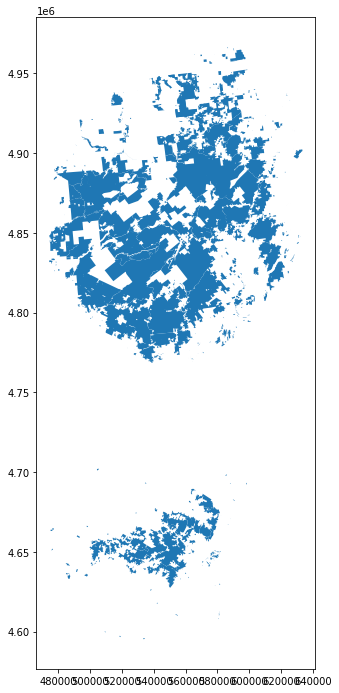

In [7]:
fig = plt.figure(figsize=(30, 18))
wild_lands.plot(figsize=(5,15))
fig.savefig("wild_land.eps", format='eps')

In [8]:
wild_lands.explore("area", legend=False)

<AxesSubplot:>

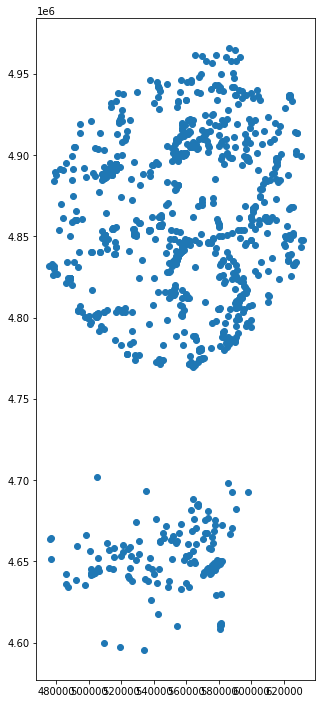

In [9]:
centroid = wild_lands.set_geometry("centroid")
centroid.plot(legend=True,figsize=(5,15))

In [10]:
x = wild_lands.set_geometry("geometry")

In [11]:
x["convex_hull"] = x.convex_hull

<AxesSubplot:>

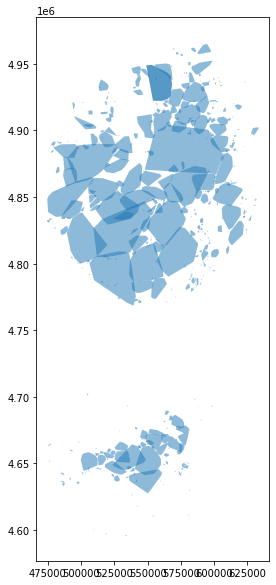

In [12]:
x["convex_hull"].plot(alpha=.5,figsize=(5,10))  
#x["boundary"].explore(ax=ax, color="white", linewidth=.5) 

<AxesSubplot:>

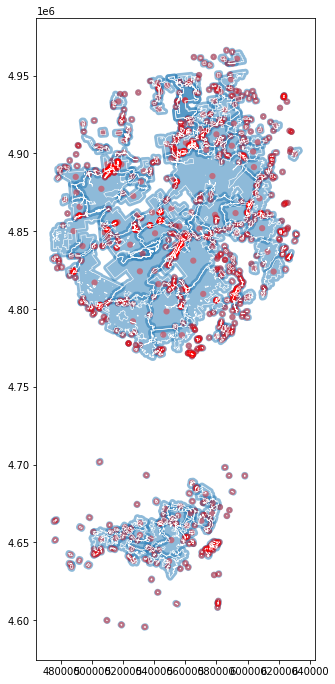

In [13]:
# buffering the active geometry by 10 000 feet (geometry is already in feet)
x["buffered"] = x.buffer(2000)

# buffering the centroid geometry by 10 000 feet (geometry is already in feet)
x["buffered_centroid"] = x["centroid"].buffer(2000)
ax = x["buffered"].plot(alpha=.5, figsize=(5,15))  # saving the first plot as an axis and setting alpha (transparency) to 0.5
x["buffered_centroid"].plot(ax=ax, color="red", alpha=.4)  # passing the first plot as an axis to the second
x["boundary"].plot(ax=ax, color="white", linewidth=.6)  # passing the first plot and setti

# campsite locations (Point)

In [14]:
# Campsites in New York state (Point)
POI_data = gpd.read_file("../input/geospatial-learn-course-data/DEC_pointsinterest/DEC_pointsinterest/Decptsofinterest.shp")
campsites = POI_data.loc[POI_data.ASSET=='PRIMITIVE CAMPSITE'].copy()
campsites.head()

,OBJECTID,UNIT,FACILITY,NAME,ASSET,DESCRIP,REGION,OFFICE,UPDATED,ASSET_UID,ACCESSIBLE,geometry
0,91706,CFP,DELAWARE WILD FOREST,ADA PRIMITIVE CAMPSITE,PRIMITIVE CAMPSITE,None,4,STAMFORD,2016-09-26,16519,N,POINT (505138.696 4649388.247)
1,108646,SCHUYLER 02,SUGAR HILL STATE FOREST,MAPLE LANE CAMPSITE #3,PRIMITIVE CAMPSITE,None,8,BATH,2018-02-23,18124,N,POINT (333481.874 4692737.800)
2,19933,AFP,MOOSE RIVER PLAINS WILD FOREST,MOOSE RIVER PLAINS CAMPSITE 103,PRIMITIVE CAMPSITE,LIVE,5,NORTHVILLE,2010-06-16,1018,N,POINT (525210.784 4833837.295)
5,39673,AFP,SARANAC LAKES WILD FOREST,SARANAC ISLANDS CAMPGROUND SITE 27,PRIMITIVE CAMPSITE,None,5,RAY BROOK,2012-01-09,5337,N,POINT (562996.482 4904871.885)
6,19434,AFP,LAKE GEORGE WILD FOREST,GAY POND ROAD CAMPSITE 13,PRIMITIVE CAMPSITE,DESIGNATED CAMPSITE WITH ACCESSIBLE PRIVY AND ...,5,WARRENSBURG,2010-05-24,3030,Y,POINT (591292.402 4807432.222)


In [15]:
# Foot trails in New York state (LineString)
roads_trails = gpd.read_file("../input/geospatial-learn-course-data/DEC_roadstrails/DEC_roadstrails/Decroadstrails.shp")
trails = roads_trails.loc[roads_trails.ASSET=='FOOT TRAIL'].copy()
trails.head()

,OBJECTID,UNIT,FACILITY,NAME,ASSET,ATV,FOOT,HORSE,BIKE,XC,...,MAPPWD,DESCRIP,ROAD_CLASS,UPDATED,REGION,OFFICE,MARKER,TRANS_UID,SHAPE_LEN,geometry
31,304,AFP,DEBAR MOUNTAIN WILD FOREST,MAIN BRANCH CANOE CARRY,FOOT TRAIL,N,M,N,N,N,...,N,None,RT,2006-08-24,5,RAY BROOK,None,244.776100,246.427662,"LINESTRING (542463.277 4933622.421, 542429.239..."
34,311,AFP,DEBAR MOUNTAIN WILD FOREST,CAMP SITE ACCESS TRAIL,FOOT TRAIL,N,Y,N,N,N,...,N,None,RT,2011-04-19,5,RAY BROOK,None,163.203974,163.203974,"LINESTRING (564033.375 4922561.921, 564100.343..."
35,312,AFP,DEBAR MOUNTAIN WILD FOREST,ACCESS TRAIL,FOOT TRAIL,N,Y,N,N,N,...,N,None,RT,2011-04-19,5,RAY BROOK,None,117.720119,117.720119,"LINESTRING (564202.360 4922745.700, 564298.863..."
37,314,AFP,DEBAR MOUNTAIN WILD FOREST,EAST BRANCH CANOE CARRY,FOOT TRAIL,N,Y,N,N,Y,...,N,None,RT,2006-08-24,5,RAY BROOK,None,386.073522,386.073522,"LINESTRING (547547.421 4942827.828, 547629.172..."
38,317,AFP,DEBAR MOUNTAIN WILD FOREST,RAINBOW LAKE TO JONES POND CANOE CARRY,FOOT TRAIL,N,Y,N,N,Y,...,N,None,RT,2011-04-19,5,RAY BROOK,None,127.460965,127.460965,"LINESTRING (564759.838 4923577.416, 564654.630..."


In [16]:
# County boundaries in New York state (Polygon)
counties = gpd.read_file("../input/geospatial-learn-course-data/NY_county_boundaries/NY_county_boundaries/NY_county_boundaries.shp")

<AxesSubplot:>

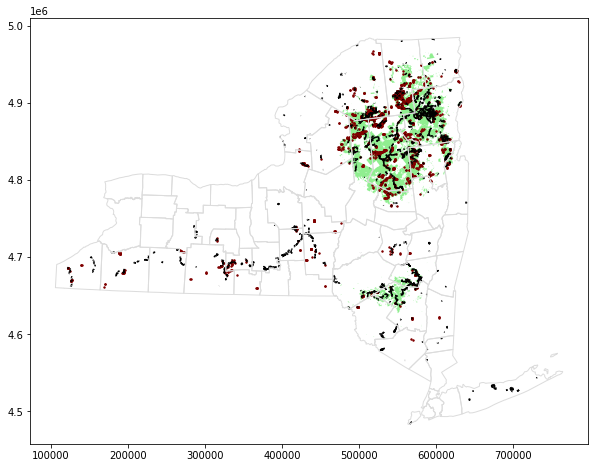

In [17]:
# Define a base map with county boundaries
ax = counties.plot(figsize=(10,10), color='none', edgecolor='gainsboro', zorder=3)

# Add wild lands, campsites, and foot trails to the base map
wild_lands.plot(color='lightgreen', ax=ax)
campsites.plot(color='maroon', markersize=2, ax=ax)
trails.plot(color='black', markersize=1, ax=ax)